<>:82: SyntaxWarning: invalid escape sequence '\R'
<>:82: SyntaxWarning: invalid escape sequence '\R'
C:\Users\gupta\AppData\Local\Temp\ipykernel_8828\4159317778.py:82: SyntaxWarning: invalid escape sequence '\R'
  img, meta = load_and_display("Images\R10.rvg")


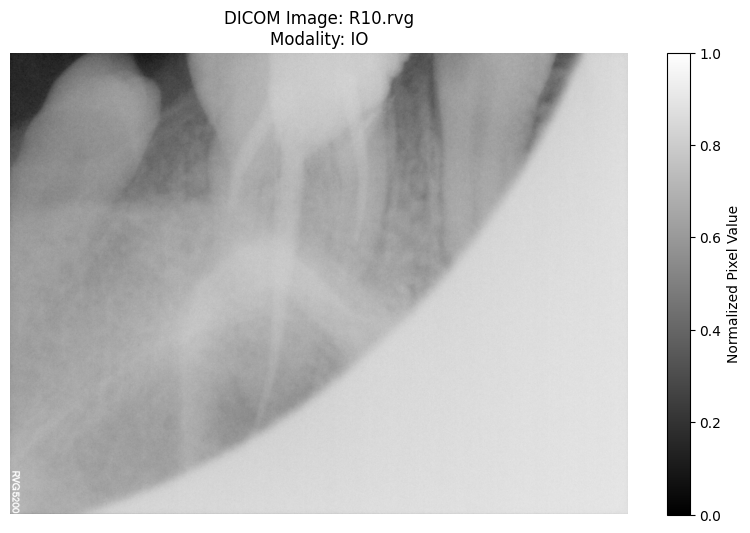


══════════════════════════════════════════════════
METADATA: R10.rvg
══════════════════════════════════════════════════
{ 'Acquisition': {'Date': '20240810', 'Time': '170747'},
  'Compression': { 'Type': 'JPEG Lossless, Non-Hierarchical, First-Order '
                           'Prediction (Process 14 [Selection Value 1])',
                   'UID': '1.2.840.10008.1.2.4.70'},
  'Patient': {'ID': '13', 'Name': 'patel^manisha'},
  'Technical': { 'Bits Stored': 12,
                 'Body Part': 'N/A',
                 'Image Size': '1168 × 1562',
                 'Modality': 'IO',
                 'Pixel Spacing': [0.019000, 0.019000]}}


In [1]:
# Parsing Meta data

import pydicom
import matplotlib.pyplot as plt
import numpy as np
import os
from pprint import pprint

def load_and_display(file_path):
    """
    Load and visualize DICOM/RVG files with metadata extraction
    
    Args:
        file_path (str): Path to .dcm or .rvg file
        
    Returns:
        tuple: (pixel_array, dataset) if successful, (None, None) if failed
    """
    try:
        # Load DICOM file with forced reading (handles some non-standard RVG files)
        ds = pydicom.dcmread(file_path, force=True)
        
        # Verify pixel data exists
        if not hasattr(ds, 'pixel_array'):
            raise ValueError("No pixel data found in DICOM file")
            
        # Get and normalize pixel data
        img = ds.pixel_array
        img = (img - img.min()) / (img.max() - img.min() + 1e-6)  # Avoid division by zero
        
        # Visualization
        plt.figure(figsize=(10, 6))
        plt.imshow(img, cmap='gray', vmin=0, vmax=1)
        plt.title(f"DICOM Image: {os.path.basename(file_path)}\nModality: {ds.get('Modality', 'UNKNOWN')}")
        plt.colorbar(label='Normalized Pixel Value')
        plt.axis('off')
        plt.show()

        # Metadata extraction
        print("\n" + "═"*50)
        print(f"METADATA: {os.path.basename(file_path)}")
        print("═"*50)
        
        metadata = {
            "Patient": {
                "ID": ds.get("PatientID", "N/A"),
                "Name": ds.get("PatientName", "N/A")
            },
            "Technical": {
                "Modality": ds.get("Modality", "N/A"),
                "Body Part": ds.get("BodyPartExamined", "N/A"),
                "Image Size": f"{ds.Rows} × {ds.Columns}",
                "Pixel Spacing": ds.get("PixelSpacing", "N/A"),
                "Bits Stored": ds.get("BitsStored", "N/A")
            },
            "Compression": {
                "Type": ds.file_meta.TransferSyntaxUID.name,
                "UID": str(ds.file_meta.TransferSyntaxUID)
            },
            "Acquisition": {
                "Date": ds.get("AcquisitionDate", "N/A"),
                "Time": ds.get("AcquisitionTime", "N/A")
            }
        }
        
        pprint(metadata, indent=2, width=80)
        
        return img, ds
        
    except pydicom.errors.InvalidDicomError:
        print(f"\n❌ Error: {file_path} is not a valid DICOM file")
    except AttributeError as e:
        print(f"\n❌ DICOM attribute error: {str(e)}")
    except Exception as e:
        print(f"\n❌ Unexpected error processing {file_path}:")
        print(f"Error type: {type(e).__name__}")
        print(f"Details: {str(e)}")
    
    return None, None

# Single file
img, meta = load_and_display("Images\R10.rvg")


In [2]:
# Extracting Image Metrics

import cv2

def normalize_dicom_pixels(ds):
    """Properly normalize DICOM pixel array accounting for:
    - Rescale Slope/Intercept
    - Photometric Interpretation
    - Bit depth
    """
    img = ds.pixel_array.astype('float32')
    
    # Apply DICOM rescaling
    slope = float(getattr(ds, 'RescaleSlope', 1))
    intercept = float(getattr(ds, 'RescaleIntercept', 0))
    img = img * slope + intercept
    
    # Handle MONOCHROME1 inversion
    if getattr(ds, 'PhotometricInterpretation', '') == 'MONOCHROME1':
        img = img.max() - img
    
    # Scale to 0-255 for metric calculation
    img = (img - img.min()) / (img.max() - img.min()) * 255
    return img.astype('uint8')

def calculate_metrics(file_path):
    try:
        ds = pydicom.dcmread(file_path, force=True)
        img = normalize_dicom_pixels(ds)
        
        metrics = {
            'Brightness': round(np.mean(img), 2),
            'Contrast': round(np.std(img), 2),
            'Sharpness': round(cv2.Laplacian(img, cv2.CV_64F).var(), 2),
            'Noise': round(np.std(img[:50, :50]), 2),  # Estimate from corner
            'Dynamic Range': f"{img.min()}-{img.max()}"
        }
        
        print(f"\n🔍 {file_path} Metrics (0-255 scale):")
        for k, v in metrics.items():
            print(f"{k+':':<12} {v}")
            
        return metrics
        
    except Exception as e:
        print(f"❌ Error in {file_path}: {str(e)}")
        return None

# Usage
calculate_metrics("Images\IS20250218_193621_8940_10081171.dcm")


🔍 Images\IS20250218_193621_8940_10081171.dcm Metrics (0-255 scale):

<>:50: SyntaxWarning: invalid escape sequence '\I'
<>:50: SyntaxWarning: invalid escape sequence '\I'
C:\Users\gupta\AppData\Local\Temp\ipykernel_8828\3567497333.py:50: SyntaxWarning: invalid escape sequence '\I'
  calculate_metrics("Images\IS20250218_193621_8940_10081171.dcm")



Brightness:  166.9
Contrast:    34.43
Sharpness:   236.92
Noise:       7.21
Dynamic Range: 0-255


{'Brightness': np.float64(166.9),
 'Contrast': np.float64(34.43),
 'Sharpness': np.float64(236.92),
 'Noise': np.float64(7.21),
 'Dynamic Range': '0-255'}


=== Processing Images\IS20250115_171841_9465_61003253.dcm ===

Original Image Metrics:
Brightness: 174.7
Contrast: 49.2
Sharpness: 82.7

After Static Processing:
Brightness: 126.4
Contrast: 75.2
Sharpness: 133.2


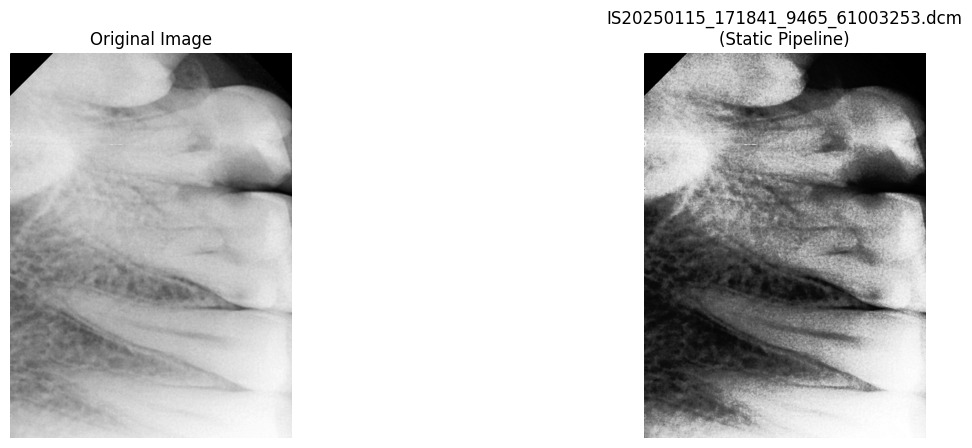


=== Processing Images\IS20250115_190348_9148_86297118.dcm ===

Original Image Metrics:
Brightness: 130.8
Contrast: 76.7
Sharpness: 116.7

After Static Processing:
Brightness: 125.9
Contrast: 75.1
Sharpness: 129.2


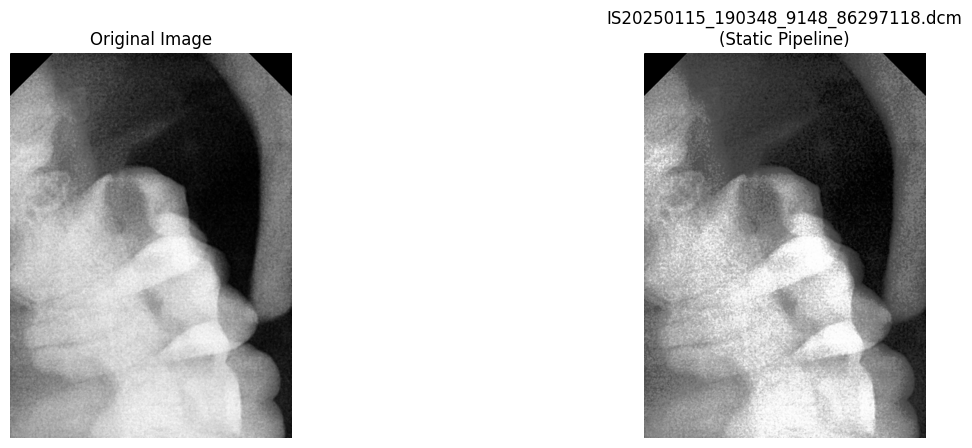


=== Processing Images\IS20250115_191316_7227_10120577.dcm ===

Original Image Metrics:
Brightness: 127.8
Contrast: 72.3
Sharpness: 101.5

After Static Processing:
Brightness: 126.0
Contrast: 74.9
Sharpness: 128.1


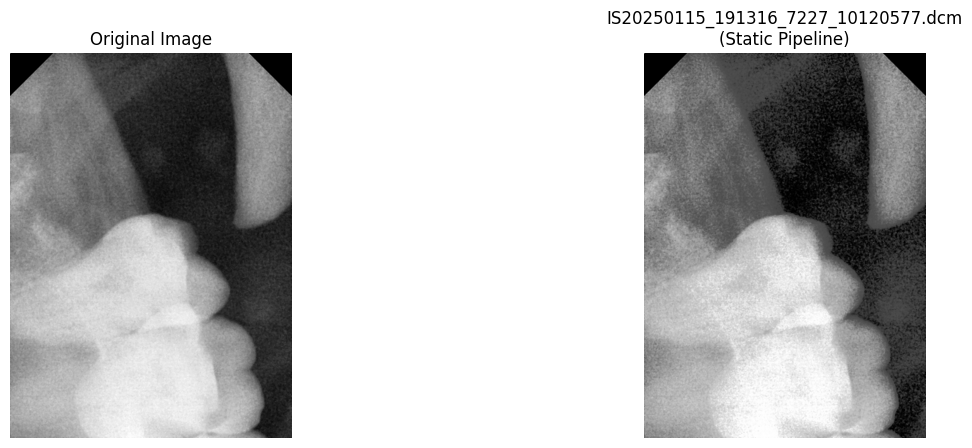


=== Processing Images\IS20250116_180218_7445_56958340.dcm ===

Original Image Metrics:
Brightness: 116.4
Contrast: 83.6
Sharpness: 89.4

After Static Processing:
Brightness: 126.5
Contrast: 74.9
Sharpness: 230.3


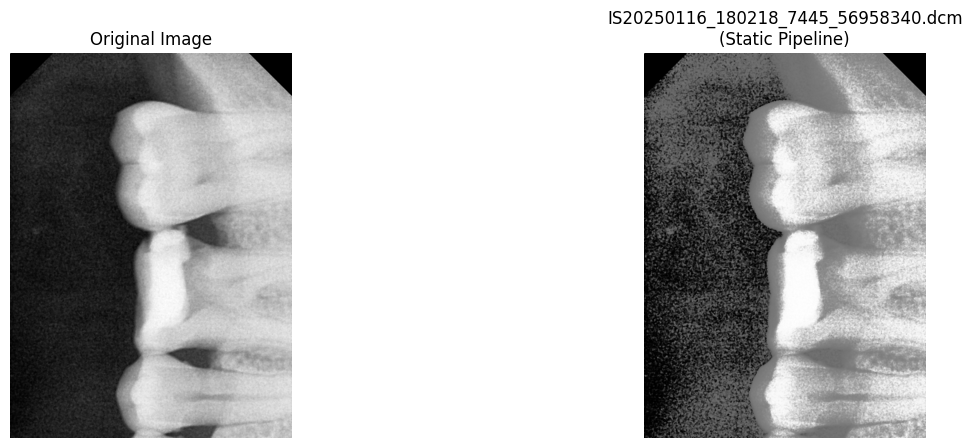


=== Processing Images\IS20250218_193552_3393_78829426.dcm ===

Original Image Metrics:
Brightness: 175.4
Contrast: 50.2
Sharpness: 175.7

After Static Processing:
Brightness: 126.7
Contrast: 75.8
Sharpness: 478.1


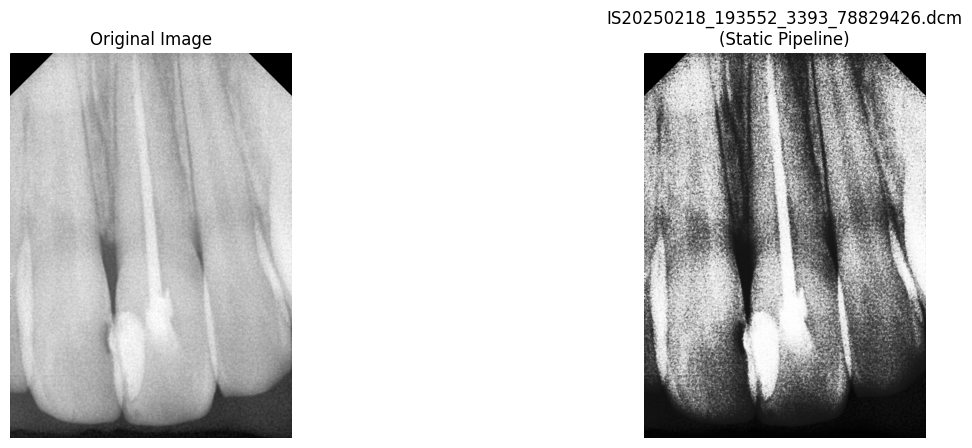


=== Processing Images\IS20250218_193621_8940_10081171.dcm ===

Original Image Metrics:
Brightness: 166.9
Contrast: 34.4
Sharpness: 236.9

After Static Processing:
Brightness: 126.8
Contrast: 76.2
Sharpness: 802.0


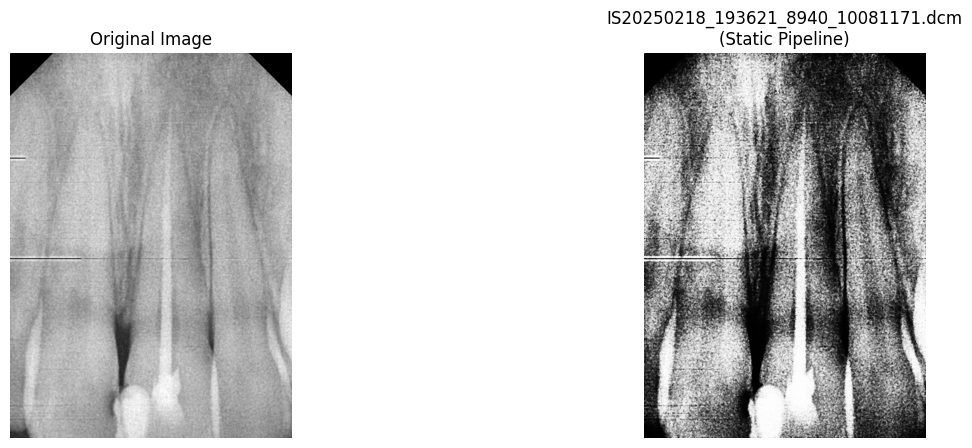


=== Processing Images\IS20250221_192657_5718_56712676.dcm ===

Original Image Metrics:
Brightness: 142.2
Contrast: 44.0
Sharpness: 373.5

After Static Processing:
Brightness: 126.2
Contrast: 75.8
Sharpness: 696.3


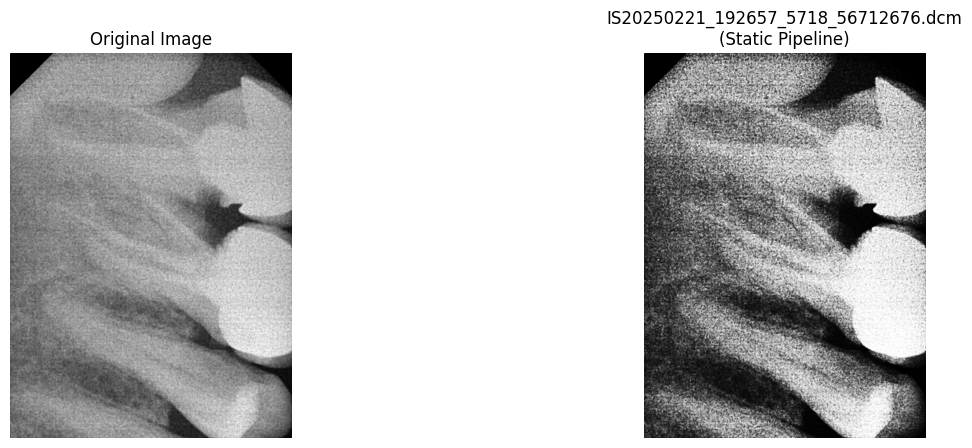


=== Processing Images\R10.rvg ===

Original Image Metrics:
Brightness: 179.3
Contrast: 37.5
Sharpness: 215.1

After Static Processing:
Brightness: 129.0
Contrast: 73.6
Sharpness: 255.5


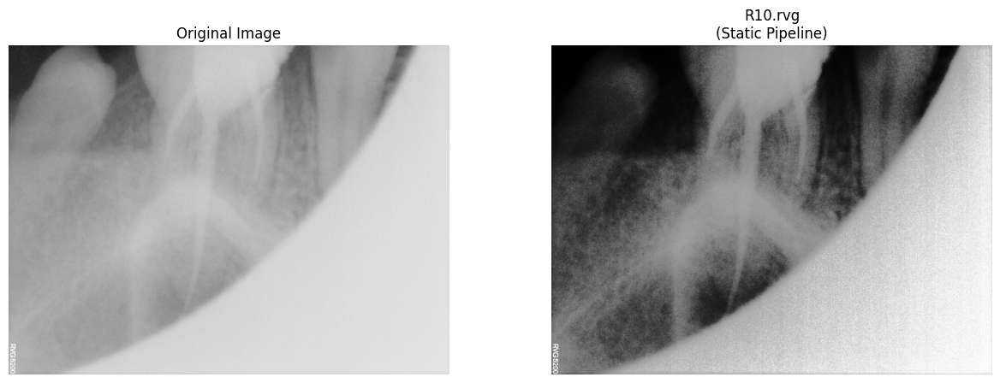


=== Processing Images\R4.rvg ===

Original Image Metrics:
Brightness: 166.8
Contrast: 31.1
Sharpness: 116.3

After Static Processing:
Brightness: 129.0
Contrast: 73.7
Sharpness: 170.4


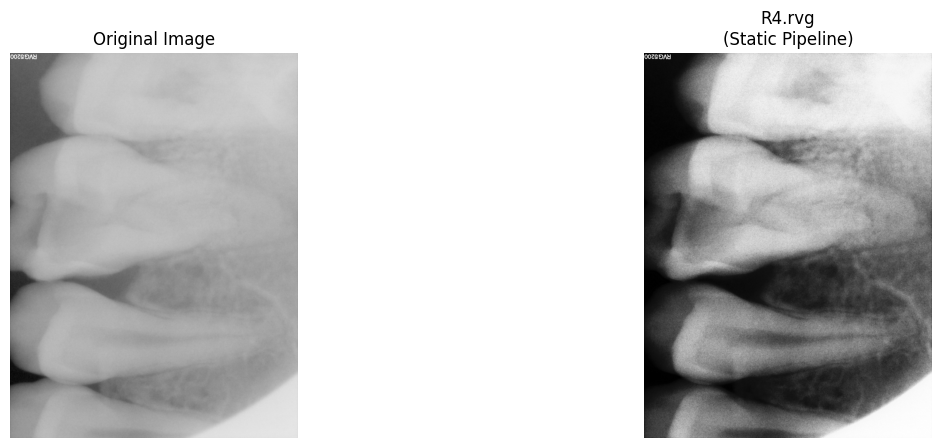


=== Processing Images\R5.rvg ===

Original Image Metrics:
Brightness: 139.6
Contrast: 42.5
Sharpness: 192.4

After Static Processing:
Brightness: 128.9
Contrast: 73.8
Sharpness: 228.9


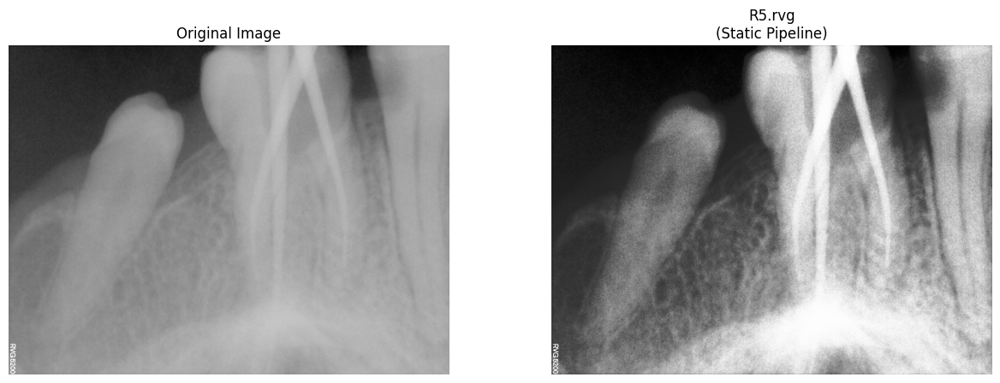


=== Processing Images\R6.rvg ===

Original Image Metrics:
Brightness: 152.0
Contrast: 35.3
Sharpness: 183.1

After Static Processing:
Brightness: 129.3
Contrast: 73.6
Sharpness: 312.0


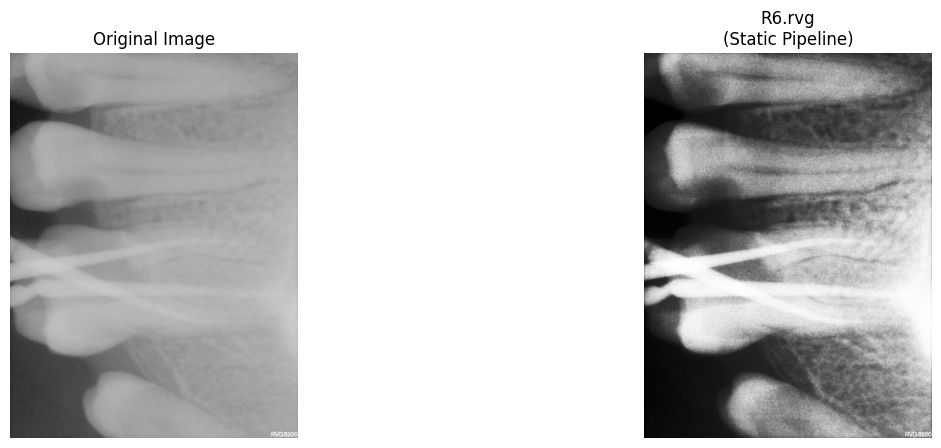


=== Processing Images\R7.rvg ===

Original Image Metrics:
Brightness: 150.9
Contrast: 29.8
Sharpness: 337.5

After Static Processing:
Brightness: 129.1
Contrast: 72.7
Sharpness: 417.2


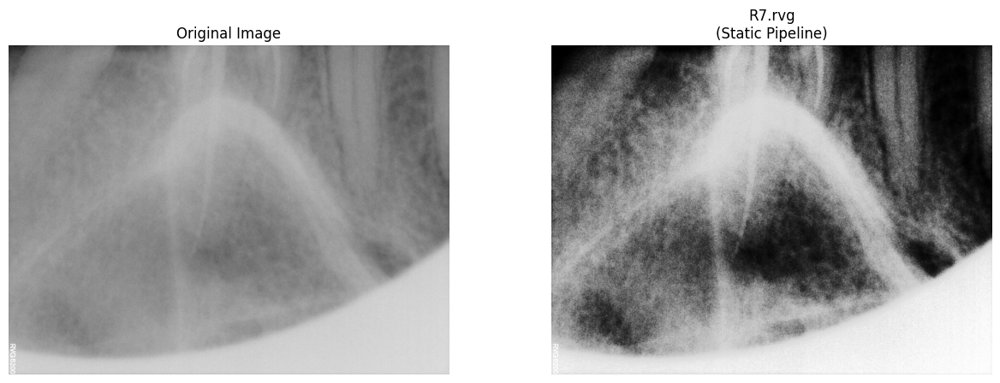


=== Processing Images\R9.rvg ===

Original Image Metrics:
Brightness: 190.0
Contrast: 45.3
Sharpness: 157.6

After Static Processing:
Brightness: 129.7
Contrast: 74.2
Sharpness: 386.3


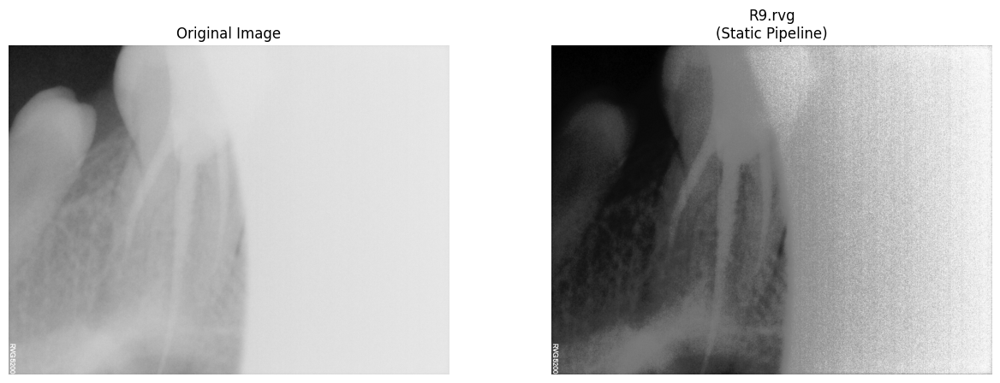

In [3]:
# Static Pipeline

from skimage import exposure

def load_dicom_file(file_path):
    """Load DICOM or DICOM-compatible RVG file with basic error handling"""
    try:
        ds = pydicom.dcmread(file_path, force=True)
        img = ds.pixel_array.astype('float32')
        
        # Apply DICOM rescaling if available
        slope = float(getattr(ds, 'RescaleSlope', 1))
        intercept = float(getattr(ds, 'RescaleIntercept', 0))
        img = img * slope + intercept
        
        # Handle MONOCHROME1 inversion
        if getattr(ds, 'PhotometricInterpretation', '') == 'MONOCHROME1':
            img = img.max() - img
            
        # Normalize to 8-bit (0-255)
        img = (img - img.min()) / (img.max() - img.min()) * 255
        return img.astype('uint8'), ds
    
    except Exception as e:
        print(f"❌ Error loading {file_path}: {str(e)}")
        return None, None

def static_preprocessing(img):
    """
    Static preprocessing pipeline with FIXED parameters:
    1. Global histogram equalization
    2. Fixed Gaussian denoising
    3. Fixed sharpening kernel
    """
    try:
        # 1. Global histogram equalization (non-adaptive)
        img_eq = cv2.equalizeHist(img)
        
        # 2. Fixed Gaussian blur (sigma=1.0)
        img_denoised = cv2.GaussianBlur(img_eq, (5,5), 1.0)
        
        # 3. Fixed sharpening kernel
        kernel = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]])
        img_sharpened = cv2.filter2D(img_denoised, -1, kernel)
        
        return {
            'equalized': img_eq,
            'denoised': img_denoised,
            'sharpened': img_sharpened
        }
    except Exception as e:
        print(f"❌ Preprocessing failed: {str(e)}")
        return None

def visualize_results(original, processed_dict, title):
    """Visual comparison of original vs processed images"""
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    plt.imshow(original, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(processed_dict['sharpened'], cmap='gray')
    plt.title(f"{title}\n(Static Pipeline)")
    plt.axis('off')
    
    plt.show()

def calculate_metrics(img):
    """Calculate basic image metrics"""
    return {
        'Brightness': np.mean(img),
        'Contrast': np.std(img),
        'Sharpness': cv2.Laplacian(img, cv2.CV_64F).var()
    }

def process_file(file_path):
    """Complete static pipeline execution"""
    print(f"\n=== Processing {file_path} ===")
    
    # 1. Load file
    img, ds = load_dicom_file(file_path)
    if img is None:
        return
    
    # 2. Original metrics
    orig_metrics = calculate_metrics(img)
    print("\nOriginal Image Metrics:")
    for k, v in orig_metrics.items():
        print(f"{k}: {v:.1f}")
    
    # 3. Apply static preprocessing
    processed = static_preprocessing(img)
    if processed is None:
        return
    
    # 4. Processed metrics
    final_metrics = calculate_metrics(processed['sharpened'])
    print("\nAfter Static Processing:")
    for k, v in final_metrics.items():
        print(f"{k}: {v:.1f}")
    
    # 5. Visual comparison
    visualize_results(img, processed, os.path.basename(file_path))

# Example usage
if __name__ == "__main__":
    import os
    image_dir = "Images"  # <-- Change to your folder path
    sample_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)
                if f.lower().endswith(('.dcm', '.rvg'))]

    
    for file in sample_files:
        if os.path.exists(file):
            process_file(file)
        else:
            print(f"⚠️ File not found: {file}")

=== Static Pipeline Analysis ===
Original Brightness: 166.9
Processed Brightness: 126.8
Original Contrast: 34.4
Processed Contrast: 76.2
Original Sharpness: 236.9
Processed Sharpness: 802.0
⚠️ Sharpness increased by 3.39× — possible oversharpening!
✅ Brightness drop (40.1) is acceptable.
✅ Contrast improved by 41.8

❌ Static pipeline is suboptimal for this image due to overprocessing.


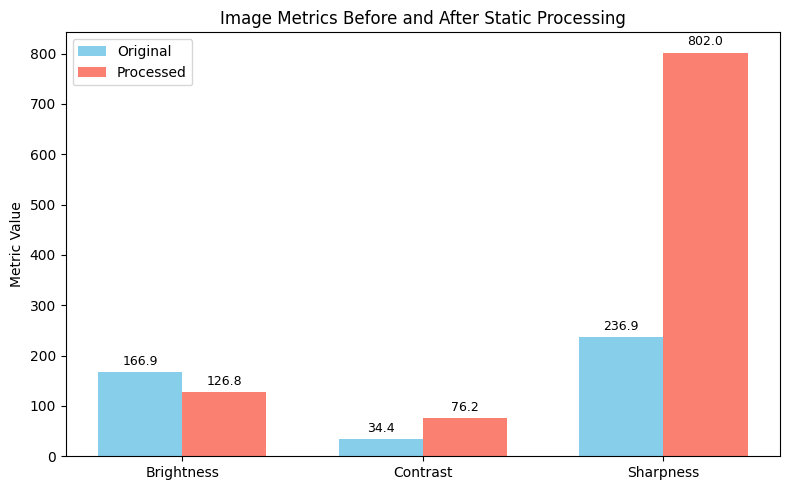

In [4]:
# Analysing Static Pipeline

import matplotlib.pyplot as plt
import numpy as np

def analyze_preprocessing_performance_with_plots(orig_metrics, processed_metrics, sharpness_threshold=3.0):
    """
    Analyze static pipeline performance and plot metric changes.
    """

    print("=== Static Pipeline Analysis ===")
    
    # Extract metrics
    orig_brightness = orig_metrics['Brightness']
    orig_contrast = orig_metrics['Contrast']
    orig_sharpness = orig_metrics['Sharpness']
    
    proc_brightness = processed_metrics['Brightness']
    proc_contrast = processed_metrics['Contrast']
    proc_sharpness = processed_metrics['Sharpness']
    
    print(f"Original Brightness: {orig_brightness:.1f}")
    print(f"Processed Brightness: {proc_brightness:.1f}")
    
    print(f"Original Contrast: {orig_contrast:.1f}")
    print(f"Processed Contrast: {proc_contrast:.1f}")
    
    print(f"Original Sharpness: {orig_sharpness:.1f}")
    print(f"Processed Sharpness: {proc_sharpness:.1f}")
    
    # Calculate ratios and differences
    sharpness_ratio = proc_sharpness / orig_sharpness if orig_sharpness > 0 else float('inf')
    brightness_drop = orig_brightness - proc_brightness
    contrast_diff = proc_contrast - orig_contrast
    
    # Analysis output
    if sharpness_ratio > sharpness_threshold:
        print(f"⚠️ Sharpness increased by {sharpness_ratio:.2f}× — possible oversharpening!")
    else:
        print(f"✅ Sharpness increase ({sharpness_ratio:.2f}×) is within acceptable range.")
    
    if brightness_drop > 50:
        print(f"⚠️ Brightness dropped by {brightness_drop:.1f} — image may be underexposed after processing!")
    else:
        print(f"✅ Brightness drop ({brightness_drop:.1f}) is acceptable.")
    
    if contrast_diff > 0:
        print(f"✅ Contrast improved by {contrast_diff:.1f}")
    else:
        print(f"⚠️ Contrast did not improve or worsened.")
    
    if sharpness_ratio > sharpness_threshold or brightness_drop > 50:
        print("\n❌ Static pipeline is suboptimal for this image due to overprocessing.")
    else:
        print("\n✅ Static pipeline performed reasonably well on this image.")
    
    # Visualization
    metrics = ['Brightness', 'Contrast', 'Sharpness']
    original_values = [orig_brightness, orig_contrast, orig_sharpness]
    processed_values = [proc_brightness, proc_contrast, proc_sharpness]
    
    x = np.arange(len(metrics))
    width = 0.35
    
    fig, ax = plt.subplots(figsize=(8,5))
    bars1 = ax.bar(x - width/2, original_values, width, label='Original', color='skyblue')
    bars2 = ax.bar(x + width/2, processed_values, width, label='Processed', color='salmon')
    
    ax.set_ylabel('Metric Value')
    ax.set_title('Image Metrics Before and After Static Processing')
    ax.set_xticks(x)
    ax.set_xticklabels(metrics)
    ax.legend()
    
    # Add value labels on bars
    def add_labels(bars):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height:.1f}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0,3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom', fontsize=9)
    
    add_labels(bars1)
    add_labels(bars2)
    
    plt.tight_layout()
    plt.show()


# Example usage with metrics
original_metrics = {
    'Brightness': 166.9,
    'Contrast': 34.4,
    'Sharpness': 236.9
}

processed_metrics = {
    'Brightness': 126.8,
    'Contrast': 76.2,
    'Sharpness': 802.0
}

analyze_preprocessing_performance_with_plots(original_metrics, processed_metrics)



=== Processing Images\IS20250115_171841_9465_61003253.dcm ===

Original Image Metrics:
Brightness: 174.7
Contrast: 49.2
Sharpness: 82.7

After Adaptive Processing:
Brightness: 158.3
Contrast: 54.8
Sharpness: 29.1


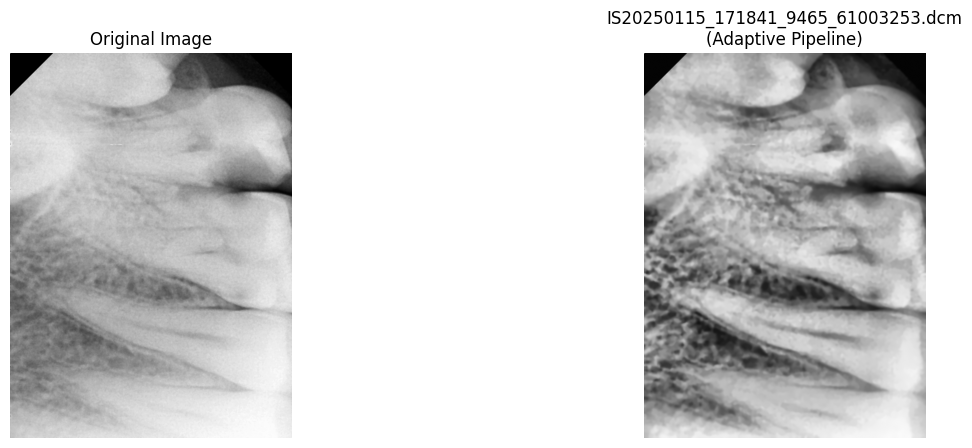


=== Processing Images\IS20250115_190348_9148_86297118.dcm ===

Original Image Metrics:
Brightness: 130.8
Contrast: 76.7
Sharpness: 116.7

After Adaptive Processing:
Brightness: 125.3
Contrast: 61.0
Sharpness: 20.7


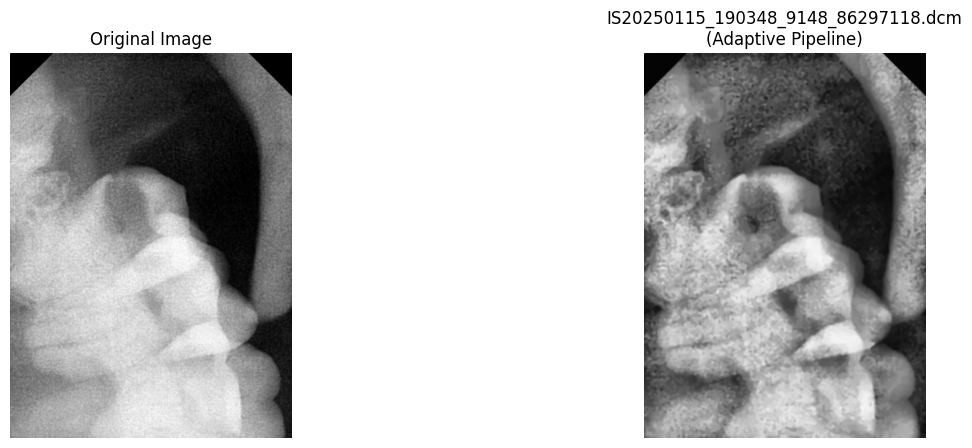


=== Processing Images\IS20250115_191316_7227_10120577.dcm ===

Original Image Metrics:
Brightness: 127.8
Contrast: 72.3
Sharpness: 101.5

After Adaptive Processing:
Brightness: 129.4
Contrast: 58.3
Sharpness: 15.9


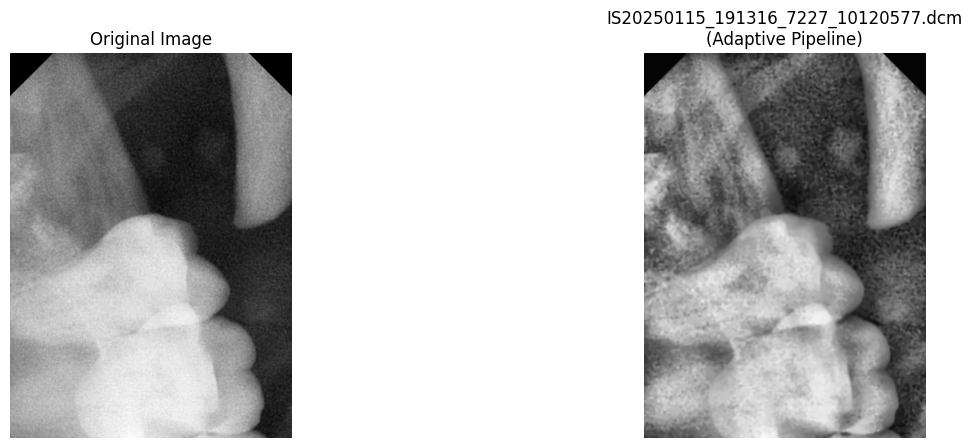


=== Processing Images\IS20250116_180218_7445_56958340.dcm ===

Original Image Metrics:
Brightness: 116.4
Contrast: 83.6
Sharpness: 89.4

After Adaptive Processing:
Brightness: 118.0
Contrast: 63.2
Sharpness: 8.5


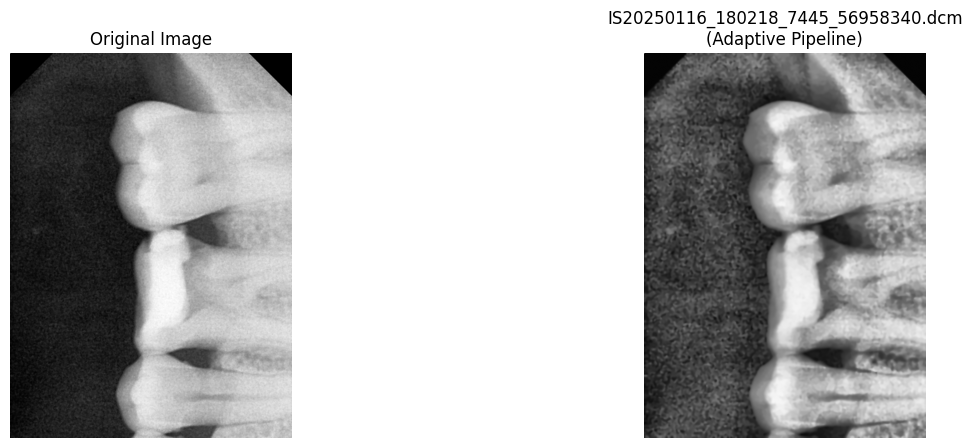


=== Processing Images\IS20250218_193552_3393_78829426.dcm ===

Original Image Metrics:
Brightness: 175.4
Contrast: 50.2
Sharpness: 175.7

After Adaptive Processing:
Brightness: 153.8
Contrast: 48.3
Sharpness: 36.2


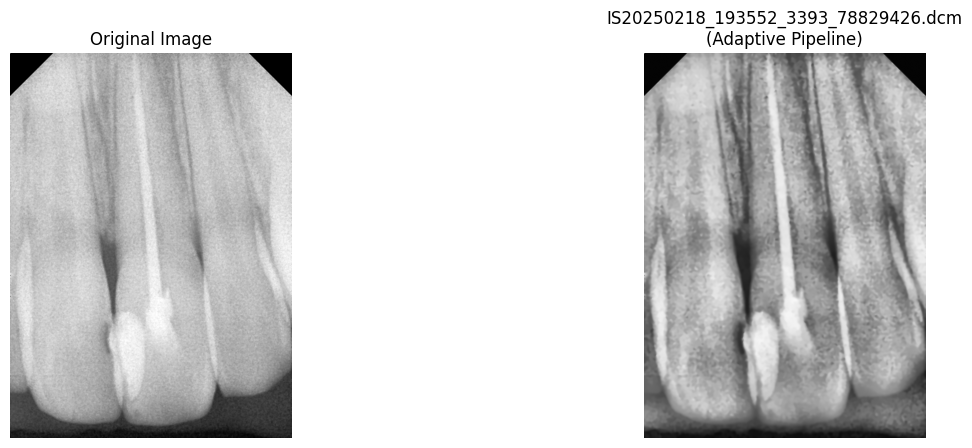


=== Processing Images\IS20250218_193621_8940_10081171.dcm ===

Original Image Metrics:
Brightness: 166.9
Contrast: 34.4
Sharpness: 236.9

After Adaptive Processing:
Brightness: 143.2
Contrast: 46.9
Sharpness: 41.7


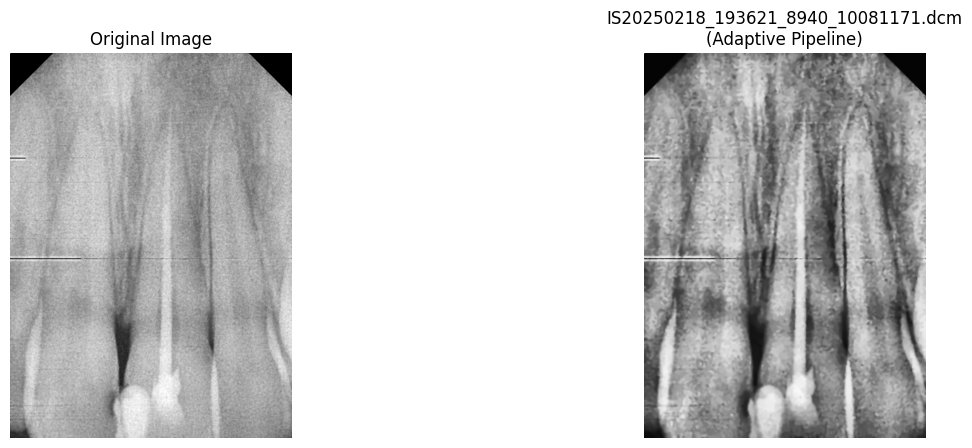


=== Processing Images\IS20250221_192657_5718_56712676.dcm ===

Original Image Metrics:
Brightness: 142.2
Contrast: 44.0
Sharpness: 373.5

After Adaptive Processing:
Brightness: 134.5
Contrast: 48.7
Sharpness: 15.6


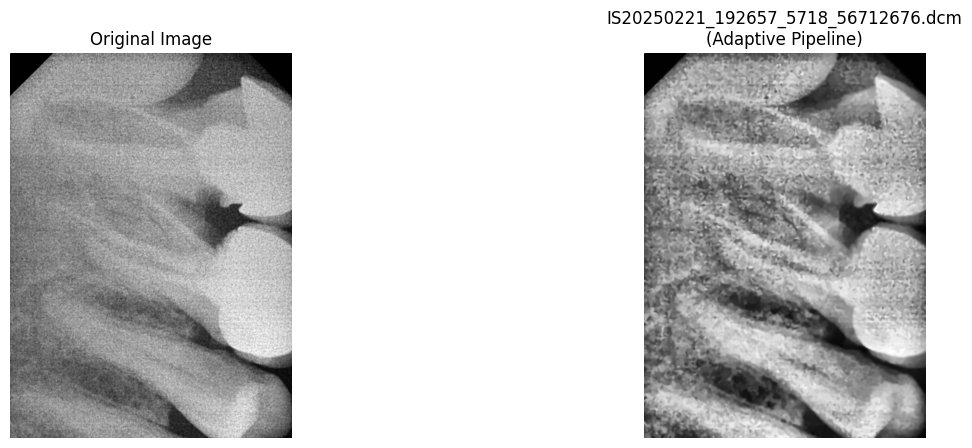


=== Processing Images\R10.rvg ===

Original Image Metrics:
Brightness: 179.3
Contrast: 37.5
Sharpness: 215.1

After Adaptive Processing:
Brightness: 167.2
Contrast: 42.1
Sharpness: 1.7


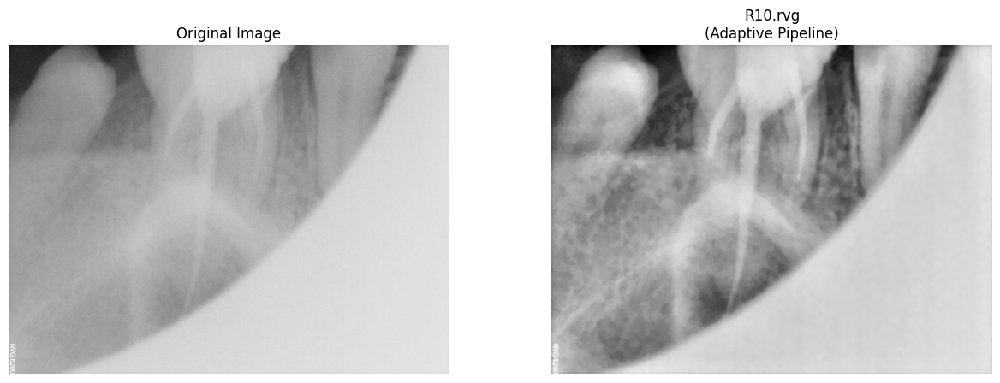


=== Processing Images\R4.rvg ===

Original Image Metrics:
Brightness: 166.8
Contrast: 31.1
Sharpness: 116.3

After Adaptive Processing:
Brightness: 158.6
Contrast: 42.8
Sharpness: 17.0


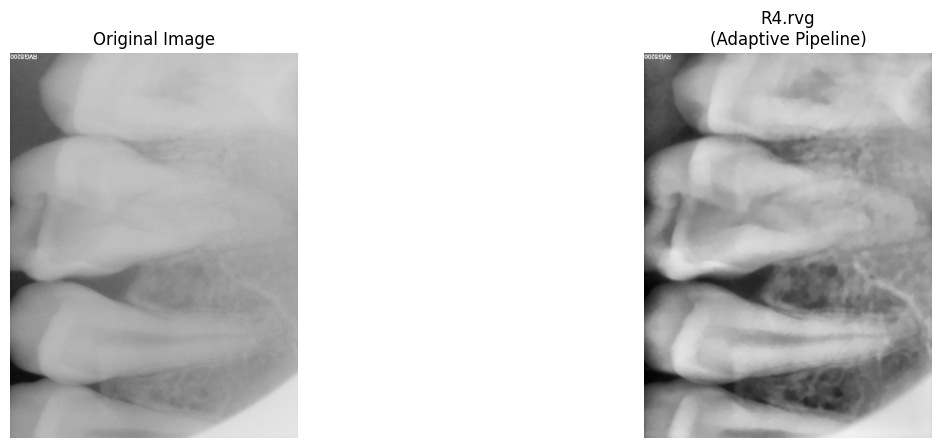


=== Processing Images\R5.rvg ===

Original Image Metrics:
Brightness: 139.6
Contrast: 42.5
Sharpness: 192.4

After Adaptive Processing:
Brightness: 139.5
Contrast: 41.6
Sharpness: 9.7


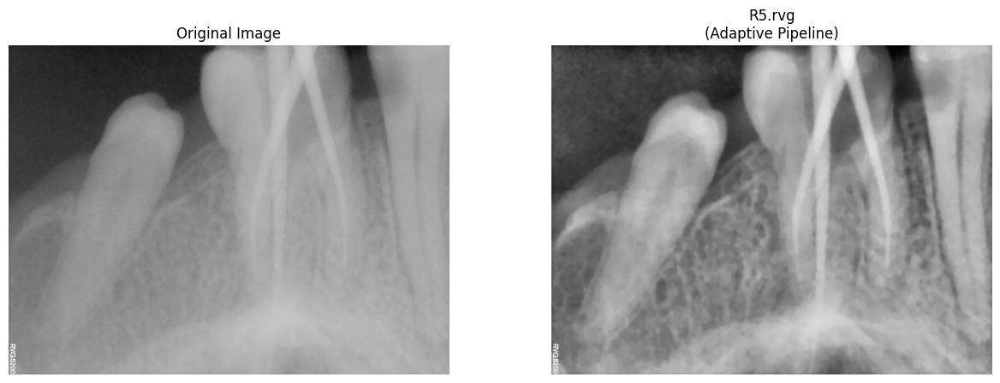


=== Processing Images\R6.rvg ===

Original Image Metrics:
Brightness: 152.0
Contrast: 35.3
Sharpness: 183.1

After Adaptive Processing:
Brightness: 147.0
Contrast: 41.1
Sharpness: 3.9


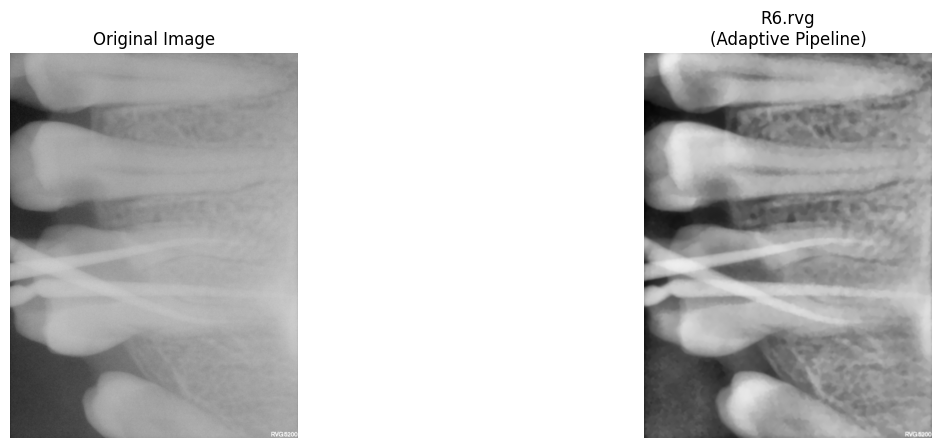


=== Processing Images\R7.rvg ===

Original Image Metrics:
Brightness: 150.9
Contrast: 29.8
Sharpness: 337.5

After Adaptive Processing:
Brightness: 145.0
Contrast: 37.1
Sharpness: 1.9


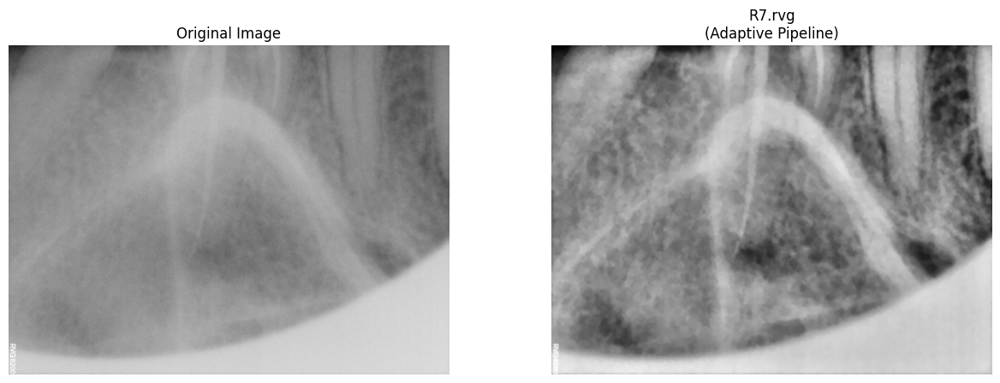


=== Processing Images\R9.rvg ===

Original Image Metrics:
Brightness: 190.0
Contrast: 45.3
Sharpness: 157.6

After Adaptive Processing:
Brightness: 178.4
Contrast: 42.9
Sharpness: 4.5


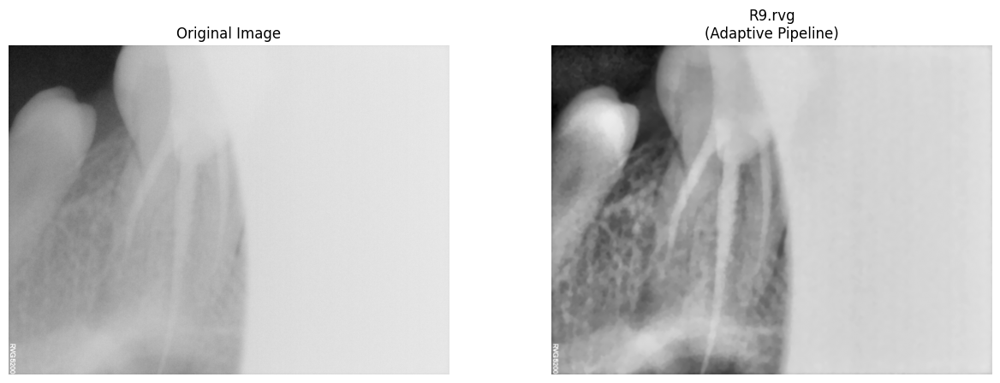

In [8]:
# Adaptive Pipeline

import pydicom
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import exposure

def adaptive_preprocessing(img):
    """
    Enhanced adaptive preprocessing:
    - CLAHE with refined clip limits
    - Noise estimated from more patches
    - Bilateral filter before sharpening for edge-preserving denoise
    - Adaptive sharpening with adjusted strength & kernel size
    """
    try:
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = np.clip(img, 0, 255).astype(np.uint8)

        contrast = np.percentile(img, 99) - np.percentile(img, 1)
        sharpness = cv2.Laplacian(img, cv2.CV_64F).var()

        # Estimate noise from eight patches for robustness
        h, w = img.shape
        patch_size = 40
        patches = [
            img[0:patch_size, 0:patch_size],
            img[0:patch_size, w-patch_size:w],
            img[h-patch_size:h, 0:patch_size],
            img[h-patch_size:h, w-patch_size:w],
            img[h//2-patch_size//2:h//2+patch_size//2, 0:patch_size],
            img[h//2-patch_size//2:h//2+patch_size//2, w-patch_size:w],
            img[0:patch_size, w//2-patch_size//2:w//2+patch_size//2],
            img[h-patch_size:h, w//2-patch_size//2:w//2+patch_size//2]
        ]
        noise_level = np.mean([np.std(p) for p in patches])

        # Adaptive CLAHE with tighter clip limit range
        clahe_clip = np.clip(contrast / 40, 1.0, 3.0)
        clahe = cv2.createCLAHE(clipLimit=clahe_clip, tileGridSize=(8, 8))
        img_clahe = clahe.apply(img)

        # Bilateral filter before denoise to preserve edges
        img_bilateral = cv2.bilateralFilter(img_clahe, d=9, sigmaColor=75, sigmaSpace=75)

        # Adaptive Denoising strength based on noise level
        denoise_strength = np.clip(noise_level * 0.6, 5, 15)
        img_denoised = cv2.fastNlMeansDenoising(
            img_bilateral, None,
            h=denoise_strength,
            templateWindowSize=7,
            searchWindowSize=21
        )

        # Adaptive sharpening: smoother blending with Gaussian blur
        if sharpness < 20:
            strength = 2.0
        elif sharpness < 80:
            strength = 1.7
        elif sharpness > 300:
            strength = 0.7
        else:
            strength = 1.1

        gaussian = cv2.GaussianBlur(img_denoised, (5, 5), 1.2)
        img_sharpened = cv2.addWeighted(
            img_denoised, strength,
            gaussian, -(strength - 1),
            0
        )

        return {
            'clahe': img_clahe,
            'denoised': img_denoised,
            'sharpened': img_sharpened,
        }

    except Exception as e:
        print(f"❌ Adaptive preprocessing failed: {str(e)}")
        return None

def visualize_results(original, processed_dict, title):
    """Visual comparison of original vs processed images"""
    plt.figure(figsize=(15,5))
    
    plt.subplot(1,2,1)
    plt.imshow(original, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1,2,2)
    plt.imshow(processed_dict['sharpened'], cmap='gray')
    plt.title(f"{title}\n(Adaptive Pipeline)")
    plt.axis('off')
    
    plt.show()

def process_file(file_path):
    """Complete static pipeline execution"""
    print(f"\n=== Processing {file_path} ===")
    
    # 1. Load file
    img, ds = load_dicom_file(file_path)
    if img is None:
        return
    
    # 2. Original metrics
    orig_metrics = calculate_metrics(img)
    print("\nOriginal Image Metrics:")
    for k, v in orig_metrics.items():
        print(f"{k}: {v:.1f}")
    
    # 3. Apply static preprocessing
    processed = adaptive_preprocessing(img)
    if processed is None:
        return
    
    # 4. Processed metrics
    final_metrics = calculate_metrics(processed['sharpened'])
    print("\nAfter Adaptive Processing:")
    for k, v in final_metrics.items():
        print(f"{k}: {v:.1f}")
    
    # 5. Visual comparison
    visualize_results(img, processed, os.path.basename(file_path))

# Example usage
if __name__ == "__main__":
    import os
    image_dir = "Images"  # <-- Change to your folder path
    sample_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)
                if f.lower().endswith(('.dcm', '.rvg'))]

    
    for file in sample_files:
        if os.path.exists(file):
            process_file(file)
        else:
            print(f"⚠️ File not found: {file}")


=== Processing Images\IS20250115_171841_9465_61003253.dcm ===


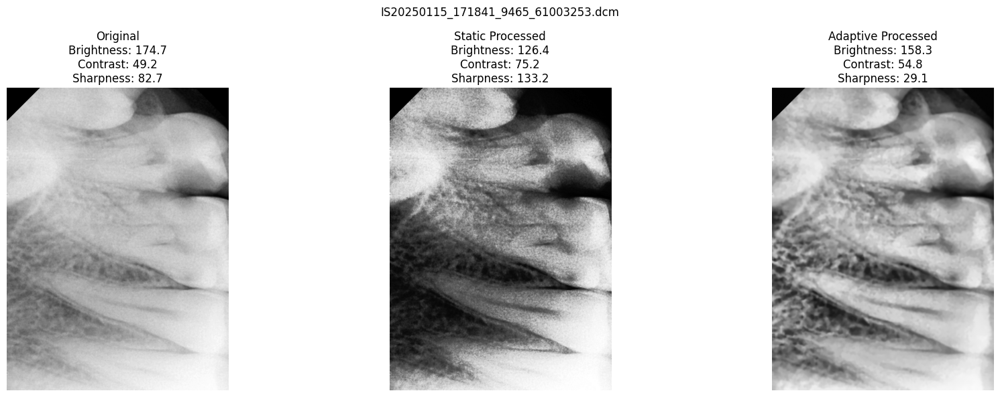


=== Processing Images\IS20250115_190348_9148_86297118.dcm ===


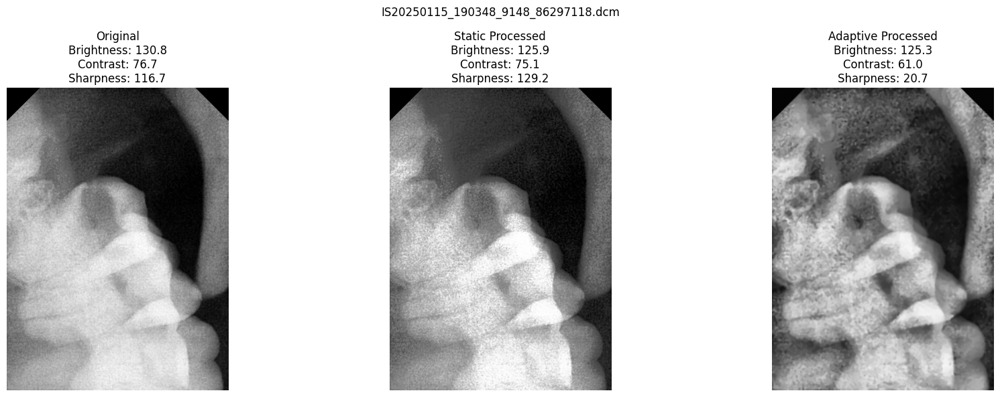


=== Processing Images\IS20250115_191316_7227_10120577.dcm ===


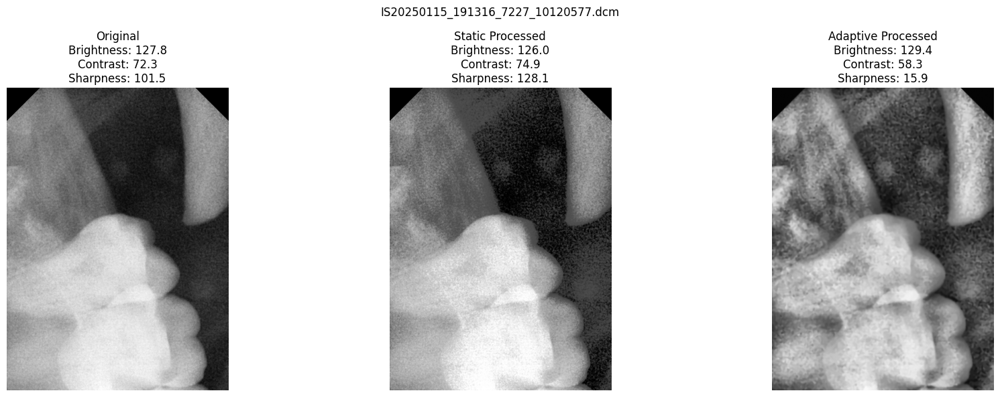


=== Processing Images\IS20250116_180218_7445_56958340.dcm ===


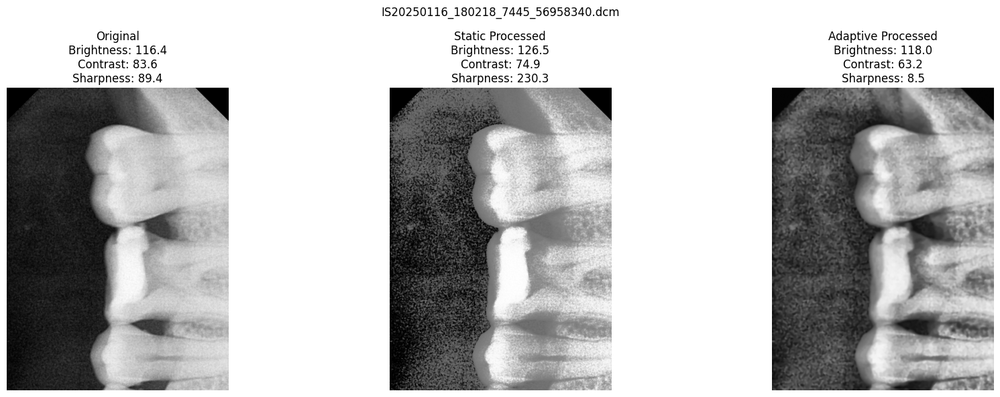


=== Processing Images\IS20250218_193552_3393_78829426.dcm ===


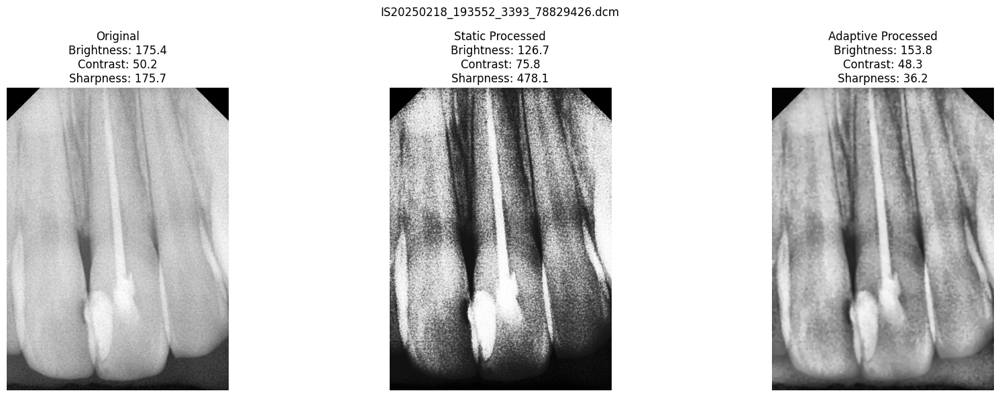


=== Processing Images\IS20250218_193621_8940_10081171.dcm ===


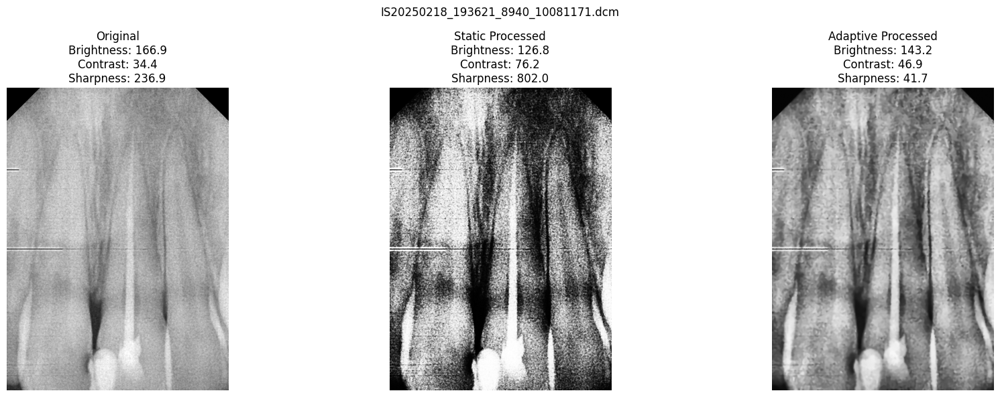


=== Processing Images\IS20250221_192657_5718_56712676.dcm ===


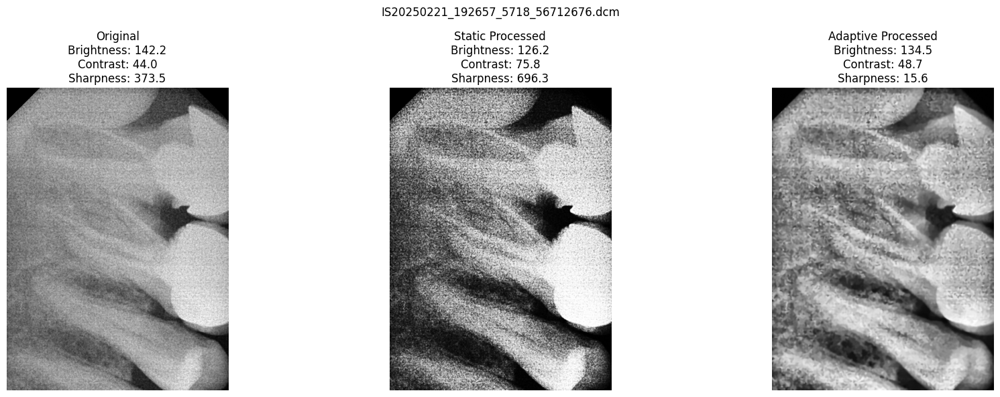


=== Processing Images\R10.rvg ===


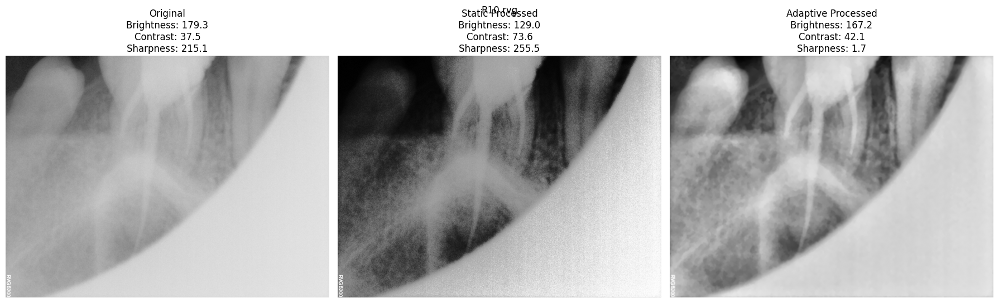


=== Processing Images\R4.rvg ===


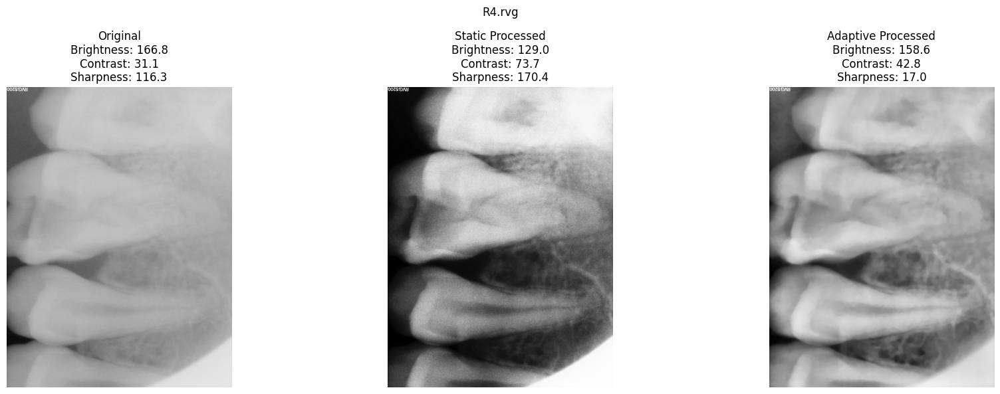


=== Processing Images\R5.rvg ===


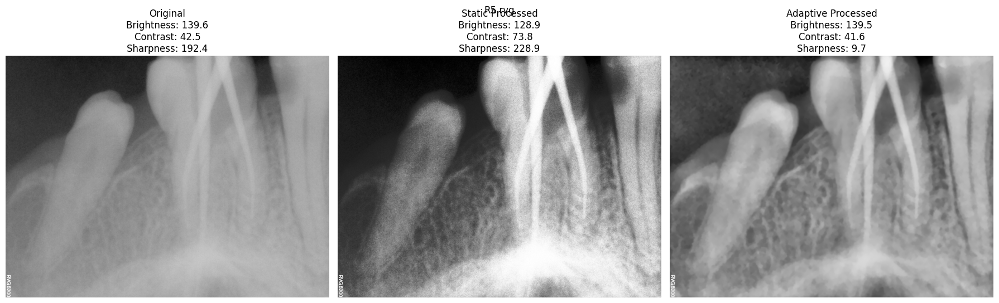


=== Processing Images\R6.rvg ===


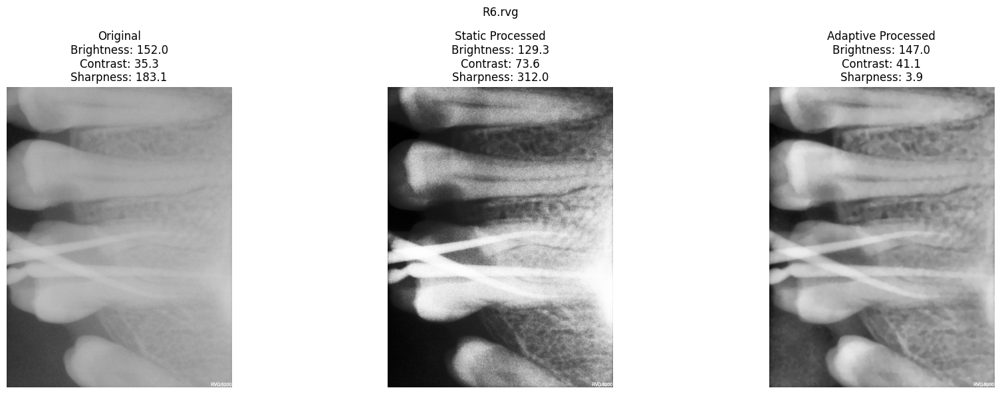


=== Processing Images\R7.rvg ===


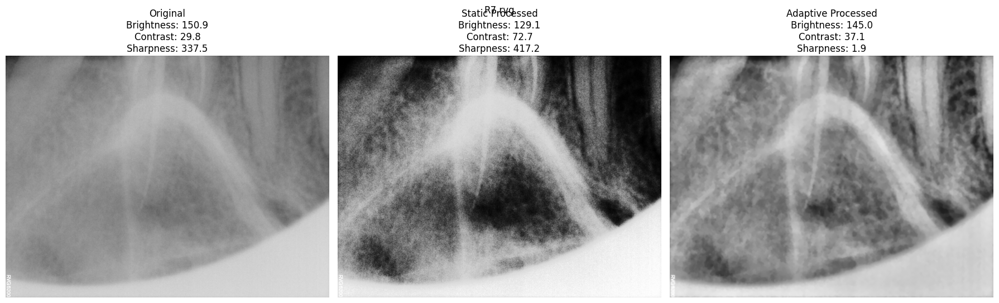


=== Processing Images\R9.rvg ===


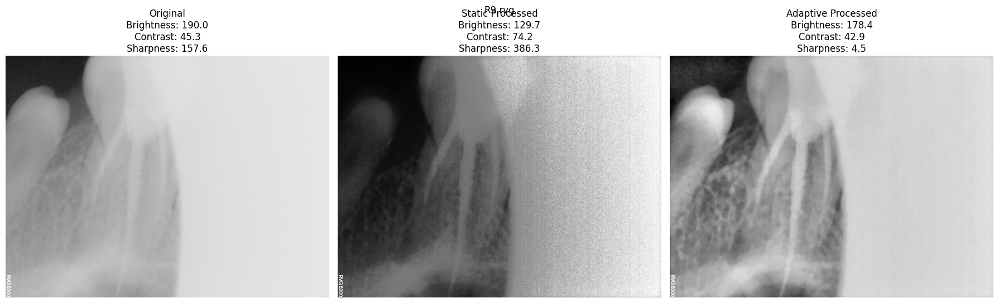

In [6]:
# Visualizing Static and Adaptive Preprocessing in Parallel

import os
import pydicom
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 3. Visualization function to show original, static, and adaptive images + metrics side-by-side
def visualize_comparison(original, static_img, adaptive_img, 
                         orig_metrics, static_metrics, adaptive_metrics, title):
    plt.figure(figsize=(18,6))

    # Original
    plt.subplot(1,3,1)
    plt.imshow(original, cmap='gray')
    plt.title(f"Original\nBrightness: {orig_metrics['Brightness']:.1f}\n"
              f"Contrast: {orig_metrics['Contrast']:.1f}\nSharpness: {orig_metrics['Sharpness']:.1f}")
    plt.axis('off')

    # Static processed (show sharpened result)
    plt.subplot(1,3,2)
    plt.imshow(static_img, cmap='gray')
    plt.title(f"Static Processed\nBrightness: {static_metrics['Brightness']:.1f}\n"
              f"Contrast: {static_metrics['Contrast']:.1f}\nSharpness: {static_metrics['Sharpness']:.1f}")
    plt.axis('off')

    # Adaptive processed (show sharpened result)
    plt.subplot(1,3,3)
    plt.imshow(adaptive_img, cmap='gray')
    plt.title(f"Adaptive Processed\nBrightness: {adaptive_metrics['Brightness']:.1f}\n"
              f"Contrast: {adaptive_metrics['Contrast']:.1f}\nSharpness: {adaptive_metrics['Sharpness']:.1f}")
    plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# 4. Main process for each file
def process_file(file_path):
    print(f"\n=== Processing {file_path} ===")

    img, ds = load_dicom_file(file_path)
    if img is None:
        return

    # Original metrics
    orig_metrics = calculate_metrics(img)

    # Static processing
    static_results = static_preprocessing(img)
    if static_results is None:
        print("Static preprocessing failed")
        return
    static_img = static_results['sharpened']
    static_metrics = calculate_metrics(static_img)

    # Adaptive processing
    adaptive_results = adaptive_preprocessing(img)
    if adaptive_results is None:
        print("Adaptive preprocessing failed")
        return
    adaptive_img = adaptive_results['sharpened']
    adaptive_metrics = calculate_metrics(adaptive_img)

    # Visualize side by side
    visualize_comparison(img, static_img, adaptive_img,
                         orig_metrics, static_metrics, adaptive_metrics,
                         os.path.basename(file_path))

# 5. Run on folder
if __name__ == "__main__":
    image_dir = "Images"
    sample_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)
                    if f.lower().endswith(('.dcm', '.rvg'))]

    for file in sample_files:
        if os.path.exists(file):
            process_file(file)
        else:
            print(f"⚠️ File not found: {file}")


In [7]:
# Metrics Evaluation of both Pipelines

import os
import numpy as np
import cv2
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from PIL import Image

def evaluate_pipeline_performance(image_folder, reference_image_path):
    results = {
        'static': {'Brightness': [], 'Contrast': [], 'Sharpness': [], 'PSNR': [], 'SSIM': []},
        'adaptive': {'Brightness': [], 'Contrast': [], 'Sharpness': [], 'PSNR': [], 'SSIM': []}
    }

    # Load and convert reference image to grayscale
    reference = Image.open(reference_image_path).convert('L')
    reference = np.array(reference)

    sample_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder)
                    if f.lower().endswith(('.dcm', '.rvg'))]

    for file in sample_files:
        img, ds = load_dicom_file(file)
        if img is None:
            continue

        for pipeline_name, preprocess_func in [('static', static_preprocessing), ('adaptive', adaptive_preprocessing)]:
            processed = preprocess_func(img)
            if processed is None:
                continue

            sharpened = processed['sharpened']
            metrics = calculate_metrics(sharpened)
            for k in ['Brightness', 'Contrast', 'Sharpness']:
                results[pipeline_name][k].append(metrics[k])

            # Resize output to match reference
            resized = cv2.resize(sharpened, (reference.shape[1], reference.shape[0]))

            # Compute PSNR & SSIM
            psnr = peak_signal_noise_ratio(reference, resized, data_range=255)
            ssim = structural_similarity(reference, resized, data_range=255)

            results[pipeline_name]['PSNR'].append(psnr)
            results[pipeline_name]['SSIM'].append(ssim)

    print("\n=== 📊 OVERALL PERFORMANCE COMPARISON ===")
    for pipeline in ['static', 'adaptive']:
        print(f"\n➡️ {pipeline.upper()} Pipeline:")
        for metric in ['Brightness', 'Contrast', 'Sharpness', 'PSNR', 'SSIM']:
            values = results[pipeline][metric]
            if values:
                print(f"   {metric}: {np.mean(values):.2f} ± {np.std(values):.2f} (n={len(values)})")
            else:
                print(f"   {metric}: No data")

    return results


# Usage - assign output to variable, don't print it directly to avoid raw data output
results = evaluate_pipeline_performance("Images","Images\Reference_Output_Quality.jpg")


<>:61: SyntaxWarning: invalid escape sequence '\R'
<>:61: SyntaxWarning: invalid escape sequence '\R'
C:\Users\gupta\AppData\Local\Temp\ipykernel_8828\186779813.py:61: SyntaxWarning: invalid escape sequence '\R'
  results = evaluate_pipeline_performance("Images","Images\Reference_Output_Quality.jpg")



=== 📊 OVERALL PERFORMANCE COMPARISON ===

➡️ STATIC Pipeline:
   Brightness: 127.65 ± 1.43 (n=13)
   Contrast: 74.57 ± 1.03 (n=13)
   Sharpness: 335.96 ± 207.65 (n=13)
   PSNR: 7.20 ± 0.76 (n=13)
   SSIM: 0.16 ± 0.04 (n=13)

➡️ ADAPTIVE Pipeline:
   Brightness: 146.02 ± 16.51 (n=13)
   Contrast: 48.37 ± 8.07 (n=13)
   Sharpness: 15.87 ± 12.53 (n=13)
   PSNR: 8.06 ± 0.73 (n=13)
   SSIM: 0.25 ± 0.02 (n=13)
